### Imports

In [435]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import image
import collections
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from sklearn.metrics import multilabel_confusion_matrix
#import keras
#from keras.models import Sequential
#from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Input
#from keras.utils import to_categorical
#from keras.preprocessing import image

from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Conv2D, Activation, Flatten, Dense, MaxPooling2D, BatchNormalization, Dropout

import PIL
from copy import deepcopy

In [437]:
#!unzip /content/tartu-object-detection-part-2.zip

### Loading in data, train and test sets

In [438]:
train = pd.read_csv("data/train.csv")
test_data = pd.read_csv("data/test.csv")
labels_data = pd.read_csv("data/labels.csv")

In [439]:
train

,image_id,labels
0,img256.jpg,l16 l18 l23 l25 l73
1,img98.jpg,l0 l24 l26 l39
2,img147.jpg,l14 l3
3,img254.jpg,l2 l25 l29
4,img160.jpg,l0 l32 l38 l40 l6
...,...,...
200,img105.jpg,l51
201,img198.jpg,l0 l10 l11 l65 l7
202,img82.jpg,l2
203,img124.jpg,l0 l1 l19 l22 l34 l6


### Turning labels column to multiple label columns
Kinda like onehotencoder

In [440]:
for label in labels_data.label_id:
  column_values = []
  for index, entry in train.iterrows():
    if label in entry.labels.split(" "):
      column_values.append(1)
    else:
      column_values.append(0)
  train[label] = column_values

In [441]:
train[:5]

,image_id,labels,l0,l1,l2,l3,l4,l5,l6,l7,...,l82,l83,l84,l85,l86,l87,l88,l89,l90,l91
0,img256.jpg,l16 l18 l23 l25 l73,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,img98.jpg,l0 l24 l26 l39,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,img147.jpg,l14 l3,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,img254.jpg,l2 l25 l29,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,img160.jpg,l0 l32 l38 l40 l6,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [442]:
print(train[:1].l16)
print(train[:1].l18)
print(train[:1].l23)
print(train[:1].l25)
print(train[:1].l73)

0    1
Name: l16, dtype: int64
0    1
Name: l18, dtype: int64
0    1
Name: l23, dtype: int64
0    1
Name: l25, dtype: int64
0    1
Name: l73, dtype: int64


### Reading in pictures

uint8
(450, 600, 3)


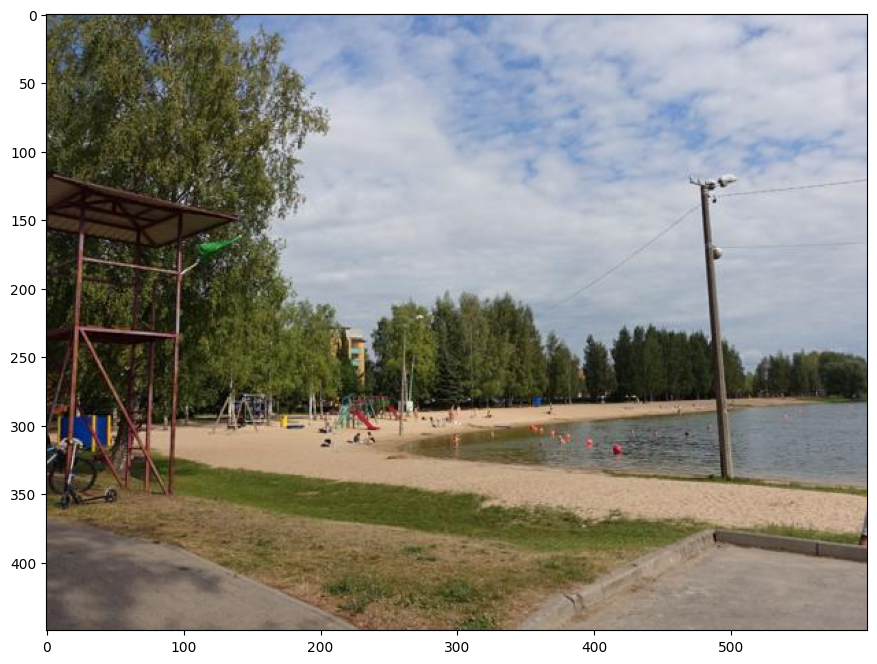

In [445]:
pic = image.imread("data/images/img120.jpg")
print(pic.dtype)
print(pic.shape)
plt.imshow(pic)
plt.show()

In [446]:
imageDir = "data/images/"
images = dict()
for imageName in os.listdir(imageDir):
  pic = image.imread(f"{imageDir}{imageName}")
  images[imageName] = pic

In [448]:
print(f"CSV files have {len(train) + len(test_data)} entries, but we have {len(images)} images.")

CSV files have 291 entries, but we have 294 images.


Going through train and test CSV and leaving only image entries that we have picture for.

In [449]:
train = train[train["image_id"].isin(images.keys())]
train = train.reset_index(drop=True)
test = test_data[test_data["image_id"].isin(images.keys())]
test = test_data.reset_index(drop=True)
print(len(train))
print(len(test_data))

201
86


In [450]:
train

,image_id,labels,l0,l1,l2,l3,l4,l5,l6,l7,...,l82,l83,l84,l85,l86,l87,l88,l89,l90,l91
0,img256.jpg,l16 l18 l23 l25 l73,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,img98.jpg,l0 l24 l26 l39,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,img147.jpg,l14 l3,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,img254.jpg,l2 l25 l29,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,img160.jpg,l0 l32 l38 l40 l6,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,img105.jpg,l51,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
197,img198.jpg,l0 l10 l11 l65 l7,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
198,img82.jpg,l2,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
199,img124.jpg,l0 l1 l19 l22 l34 l6,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


Changing img278.jpg labels, because they are wrong.

In [451]:
#train.loc[train["image_id"] == "img278.jpg"]
#for label in ["l0", "l12", "l3", "l37", "l38", "l40", "l80"]:
#    train.at[143, label] = 0
# replacing
# for ...
#train.loc[train["image_id"] == "img278.jpg"]

# or just remove it
train.drop(train.loc[train["image_id"] == "img278.jpg"].index, inplace=True)
train.reset_index(drop=True, inplace=True)
train.loc[train["image_id"] == "img278.jpg"]


,image_id,labels,l0,l1,l2,l3,l4,l5,l6,l7,...,l82,l83,l84,l85,l86,l87,l88,l89,l90,l91


Adding imagedata to dataframe

In [465]:
train_images = []
test_images = []
for index, entry in train.iterrows():
  train_images.append(images[entry.image_id])
for index, entry in test.iterrows():
  test_images.append(images[entry.image_id])
train["image_data"] = train_images
test_data["image_data"] = test_images

In [466]:
train[:5]

,image_id,labels,l0,l1,l2,l3,l4,l5,l6,l7,...,l83,l84,l85,l86,l87,l88,l89,l90,l91,image_data
0,img256.jpg,l16 l18 l23 l25 l73,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"[[[135, 159, 187], [135, 159, 187], [134, 158, 186], [133, 157, 185], [131, 154, 185], [130, 153, 184], [129, 152, 183], [128, 151, 182], [129, 152, 184], [129, 152, 184], [130, 153, 185], [130, 153, 185], [130, 153, 187], [129, 152, 186], [128, 151, 185], [127, 150, 184], [127, 147, 180], [127, 147, 180], [126, 146, 179], [125, 145, 178], [125, 145, 178], [125, 145, 178], [126, 146, 179], [126, 146, 179], [127, 147, 180], [126, 146, 179], [126, 146, 179], [125, 145, 178], [125, 145, 178], [124, 144, 177], [124, 144, 177], [121, 144, 176], [123, 146, 178], [123, 148, 179], [123, 148, 179],..."
1,img98.jpg,l0 l24 l26 l39,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"[[[176, 192, 205], [176, 192, 205], [177, 193, 206], [177, 193, 206], [178, 194, 207], [179, 195, 208], [180, 196, 209], [180, 196, 209], [181, 197, 210], [181, 197, 210], [181, 197, 210], [182, 198, 211], [182, 198, 211], [182, 198, 211], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [187, 201, 214], [187, 201, 214], [187, 201, 214],..."
2,img147.jpg,l14 l3,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"[[[89, 73, 73], [98, 84, 83], [99, 88, 86], [101, 93, 91], [106, 105, 103], [101, 102, 106], [89, 96, 104], [90, 100, 112], [95, 103, 122], [88, 99, 119], [92, 103, 121], [98, 110, 124], [106, 117, 121], [122, 134, 130], [133, 145, 133], [128, 139, 125], [114, 115, 107], [107, 109, 106], [91, 96, 102], [83, 93, 103], [82, 98, 114], [77, 94, 110], [75, 93, 105], [88, 105, 112], [110, 124, 124], [124, 137, 130], [84, 94, 86], [95, 106, 100], [91, 101, 103], [86, 99, 108], [88, 100, 122], [76, 93, 113], [81, 98, 114], [77, 95, 105], [92, 105, 113], [121, 130, 135], [123, 126, 131], [89, 90, 9..."
3,img254.jpg,l2 l25 l29,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"[[[159, 181, 202], [158, 180, 201], [158, 180, 201], [157, 179, 200], [156, 178, 199], [155, 177, 198], [152, 177, 197], [152, 177, 197], [152, 177, 197], [151, 176, 196], [149, 176, 195], [149, 176, 195], [148, 177, 195], [150, 179, 197], [151, 180, 198], [154, 181, 200], [155, 180, 202], [158, 180, 203], [159, 181, 202], [161, 183, 204], [164, 185, 206], [166, 187, 208], [168, 189, 208], [169, 190, 209], [171, 189, 209], [172, 190, 210], [173, 192, 209], [175, 194, 211], [178, 195, 213], [180, 197, 215], [182, 199, 217], [183, 200, 218], [182, 201, 218], [182, 201, 218], [181, 200, 217],..."
4,img160.jpg,l0 l32 l38 l40 l6,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,"[[[149, 180, 162], [152, 185, 168], [153, 187, 171], [148, 186, 173], [145, 187, 177], [141, 186, 179], [132, 181, 178], [123, 174, 175], [108, 163, 168], [98, 157, 163], [92, 150, 161], [89, 149, 159], [90, 152, 165], [91, 153, 166], [88, 150, 163], [83, 147, 159], [79, 142, 157], [77, 143, 157], [76, 144, 157], [76, 144, 157], [76, 144, 157], [77, 145, 158], [77, 146, 161], [78, 147, 162], [77, 146, 161], [77, 146, 161], [75, 147, 162], [75, 147, 162], [75, 147, 162], [75, 147, 162], [74, 147, 164], [74, 147, 164], [74, 149, 168], [74, 149, 168], [74, 149, 168], [74, 149, 168], [74, 149,..."


In [467]:
train_X = train.image_data
train_y = train.drop(["image_id", "labels", "image_data"], axis = 1)
test_X = test_data.image_data

In [468]:
train_X[0]

array([[[135, 159, 187],
        [135, 159, 187],
        [134, 158, 186],
        ...,
        [216, 224, 237],
        [217, 224, 240],
        [215, 224, 239]],

       [[136, 160, 188],
        [135, 159, 187],
        [134, 158, 186],
        ...,
        [216, 224, 237],
        [217, 224, 240],
        [215, 224, 239]],

       [[136, 160, 188],
        [135, 159, 187],
        [134, 158, 186],
        ...,
        [216, 224, 237],
        [216, 223, 239],
        [215, 224, 239]],

       ...,

       [[ 57,  58,  63],
        [ 69,  70,  75],
        [ 71,  72,  77],
        ...,
        [115, 116, 120],
        [110, 111, 115],
        [110, 111, 115]],

       [[ 54,  54,  62],
        [ 60,  60,  68],
        [ 59,  59,  67],
        ...,
        [114, 115, 119],
        [121, 122, 126],
        [122, 123, 127]],

       [[ 61,  61,  71],
        [ 59,  59,  69],
        [ 62,  62,  70],
        ...,
        [113, 114, 118],
        [111, 112, 116],
        [113, 114, 118]]

In [469]:
train.labels

0        l16 l18 l23 l25 l73
1             l0 l24 l26 l39
2                     l14 l3
3                 l2 l25 l29
4          l0 l32 l38 l40 l6
               ...          
195                      l51
196        l0 l10 l11 l65 l7
197                       l2
198     l0 l1 l19 l22 l34 l6
199    l1 l15 l18 l2 l21 l71
Name: labels, Length: 200, dtype: object

In [470]:
train_y

,l0,l1,l2,l3,l4,l5,l6,l7,l8,l9,...,l82,l83,l84,l85,l86,l87,l88,l89,l90,l91
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
196,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
197,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
198,1,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<BarContainer object of 92 artists>

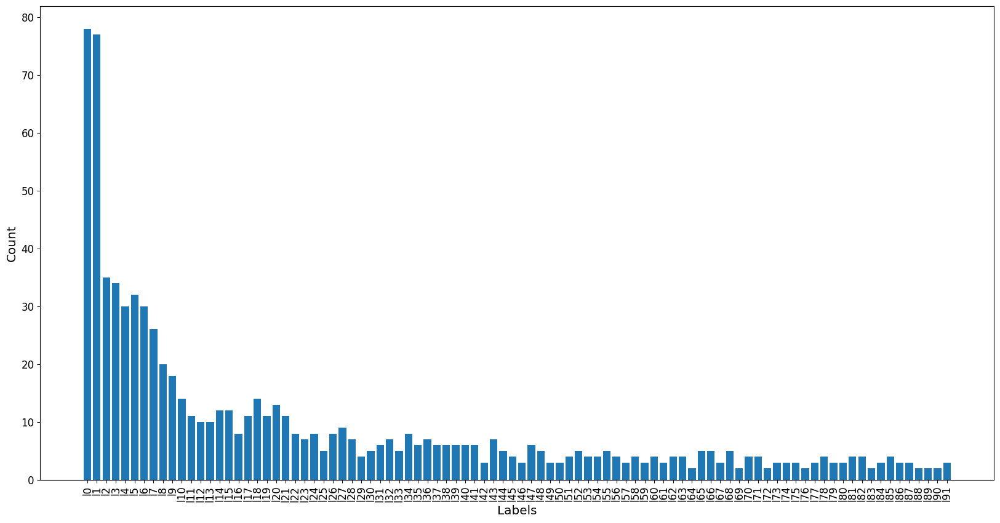

In [471]:
label = []
counts = []
for col in train_y:
    count = train_y[col].value_counts()
    label.append(col)
    counts.append(count[1])
count = train_y["l4"].value_counts()

plt.figure(figsize=(20, 10))
plt.xticks(rotation=90, fontsize="large")
plt.yticks(fontsize="large")
plt.xlabel("Labels", fontsize="x-large")
plt.ylabel("Count", fontsize="x-large")
plt.bar(label, counts)

Remove labels that are not frequent.

In [472]:
train_less_labels = train.copy()

Removing onehot-columns

In [473]:
min_count = 10
for i in range(92):
    label = "l"+str(i)
    count = train_less_labels[label].sum()
    #print(count)
    if count < min_count:
        train_less_labels.drop(label, inplace=True, axis=1)

Fixing labels colummn values

In [474]:
remaining = ['l0', 'l1', 'l2', 'l3', 'l4', 'l5', 'l6', 'l7', 'l8', 'l9', 'l10', 'l11', 'l12', 'l13', 'l14', 'l15', 'l17', 'l18', 'l19', 'l20', 'l21']
len(labels_using)

for i in range(len(train_less_labels)):
    new_values = " ".join([x for x in train_less_labels.iloc[i].labels.split(" ") if x in remaining])
    
    if i == 143:
        print(train_less_labels.iloc[i].labels)
        print(new_values)
    train_less_labels.iloc[i, 1] = new_values
    #train_fastai.loc[i, ["labels"]] = "a"

l13 l2 l23 l51
l13 l2


Removing rows where "labels" is empty

In [475]:
to_drop = []
for i, label in enumerate(train_less_labels.labels):
    if label == "":
        to_drop.append(i)
print(to_drop)
# img217
train_less_labels.drop(train_less_labels.index[to_drop], inplace=True)

[15, 19, 26, 27, 31, 57, 89, 97, 102, 106, 127, 136, 144, 175, 177, 193, 194, 195]


In [463]:
train_less_labels.reset_index(drop=True, inplace=True)
train_less_labels.head(20)

,image_id,labels,l0,l1,l2,l3,l4,l5,l6,l7,...,l12,l13,l14,l15,l17,l18,l19,l20,l21,image_data
0,img256.jpg,l18,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,"[[[135, 159, 187], [135, 159, 187], [134, 158, 186], [133, 157, 185], [131, 154, 185], [130, 153, 184], [129, 152, 183], [128, 151, 182], [129, 152, 184], [129, 152, 184], [130, 153, 185], [130, 153, 185], [130, 153, 187], [129, 152, 186], [128, 151, 185], [127, 150, 184], [127, 147, 180], [127, 147, 180], [126, 146, 179], [125, 145, 178], [125, 145, 178], [125, 145, 178], [126, 146, 179], [126, 146, 179], [127, 147, 180], [126, 146, 179], [126, 146, 179], [125, 145, 178], [125, 145, 178], [124, 144, 177], [124, 144, 177], [121, 144, 176], [123, 146, 178], [123, 148, 179], [123, 148, 179],..."
1,img98.jpg,l0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"[[[176, 192, 205], [176, 192, 205], [177, 193, 206], [177, 193, 206], [178, 194, 207], [179, 195, 208], [180, 196, 209], [180, 196, 209], [181, 197, 210], [181, 197, 210], [181, 197, 210], [182, 198, 211], [182, 198, 211], [182, 198, 211], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [183, 199, 212], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [184, 200, 213], [187, 201, 214], [187, 201, 214], [187, 201, 214],..."
2,img147.jpg,l14 l3,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,"[[[89, 73, 73], [98, 84, 83], [99, 88, 86], [101, 93, 91], [106, 105, 103], [101, 102, 106], [89, 96, 104], [90, 100, 112], [95, 103, 122], [88, 99, 119], [92, 103, 121], [98, 110, 124], [106, 117, 121], [122, 134, 130], [133, 145, 133], [128, 139, 125], [114, 115, 107], [107, 109, 106], [91, 96, 102], [83, 93, 103], [82, 98, 114], [77, 94, 110], [75, 93, 105], [88, 105, 112], [110, 124, 124], [124, 137, 130], [84, 94, 86], [95, 106, 100], [91, 101, 103], [86, 99, 108], [88, 100, 122], [76, 93, 113], [81, 98, 114], [77, 95, 105], [92, 105, 113], [121, 130, 135], [123, 126, 131], [89, 90, 9..."
3,img254.jpg,l2,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"[[[159, 181, 202], [158, 180, 201], [158, 180, 201], [157, 179, 200], [156, 178, 199], [155, 177, 198], [152, 177, 197], [152, 177, 197], [152, 177, 197], [151, 176, 196], [149, 176, 195], [149, 176, 195], [148, 177, 195], [150, 179, 197], [151, 180, 198], [154, 181, 200], [155, 180, 202], [158, 180, 203], [159, 181, 202], [161, 183, 204], [164, 185, 206], [166, 187, 208], [168, 189, 208], [169, 190, 209], [171, 189, 209], [172, 190, 210], [173, 192, 209], [175, 194, 211], [178, 195, 213], [180, 197, 215], [182, 199, 217], [183, 200, 218], [182, 201, 218], [182, 201, 218], [181, 200, 217],..."
4,img160.jpg,l0 l6,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,"[[[149, 180, 162], [152, 185, 168], [153, 187, 171], [148, 186, 173], [145, 187, 177], [141, 186, 179], [132, 181, 178], [123, 174, 175], [108, 163, 168], [98, 157, 163], [92, 150, 161], [89, 149, 159], [90, 152, 165], [91, 153, 166], [88, 150, 163], [83, 147, 159], [79, 142, 157], [77, 143, 157], [76, 144, 157], [76, 144, 157], [76, 144, 157], [77, 145, 158], [77, 146, 161], [78, 147, 162], [77, 146, 161], [77, 146, 161], [75, 147, 162], [75, 147, 162], [75, 147, 162], [75, 147, 162], [74, 147, 164], [74, 147, 164], [74, 149, 168], [74, 149, 168], [74, 149, 168], [74, 149, 168], [74, 149,..."
5,img55.jpg,l3 l9,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"[[[157, 161, 147], [150, 154, 140], [145, 145, 135], [144, 141, 132], [139, 134, 128], [161, 154, 148], [182, 171, 169], [186, 175, 173], [129, 115, 112], [131, 120, 116], [142, 131, 125], [138, 131, 121], [167, 160, 150], [183, 181, 168], [198, 196, 181], [128, 139, 125], [95, 122, 115], [111, 140, 138], [164, 175, 181], [162, 162, 172], [152, 150, 163], [163, 167, 178], [136, 154, 158], [119, 145, 144], [115, 144, 142], [115, 135, 133], [109, 115, 113], [91, 86, 83], [69, 55, 52], [61, 48, 40], [84, 75, 66], [115, 112, 97], [138, 135, 118], [114, 109, 87],

In [476]:
train_X = train_less_labels.image_data
train_y = train_less_labels.drop(["image_id", "labels", "image_data"], axis = 1)
test_X = test_data.image_data

<BarContainer object of 21 artists>

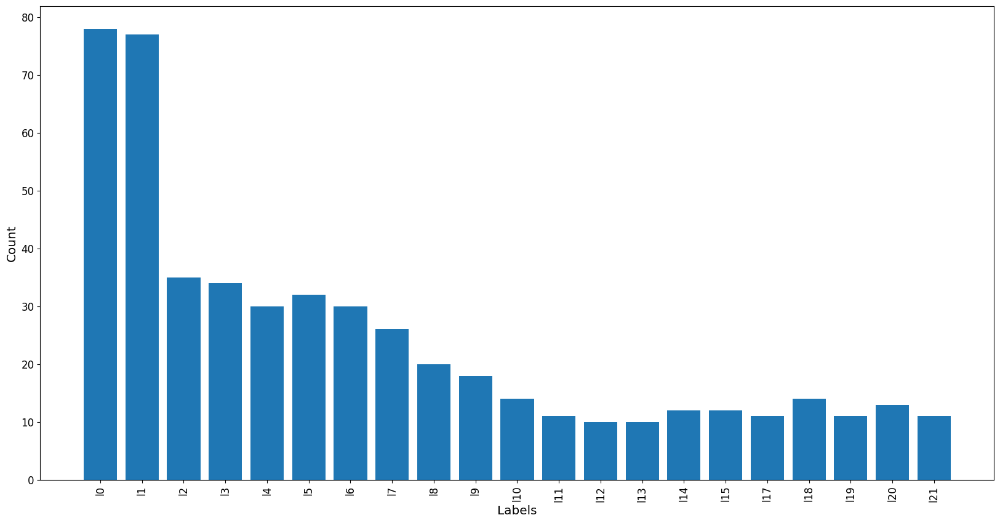

In [477]:
label = []
counts = []
for col in train_y:
    count = train_y[col].value_counts()
    label.append(col)
    counts.append(count[1])
count = train_y["l4"].value_counts()

plt.figure(figsize=(20, 10))
plt.xticks(rotation=90, fontsize="large")
plt.yticks(fontsize="large")
plt.xlabel("Labels", fontsize="x-large")
plt.ylabel("Count", fontsize="x-large")
plt.bar(label, counts)


In [308]:
# remove some l0 and l1 images
#l0_indexes = []
#l1_indexes = []

#for index, row in train.iterrows():
#    if "l0" in row.labels and len(l0_indexes) < 40:
#        l0_indexes.append(index)
#    elif "l1" in row.labels and len(l1_indexes) < 40:
#        l1_indexes.append(index)

#print(len(l0_indexes))
#print(len(l1_indexes))

#to_remove = list(set(l0_indexes + l1_indexes))
#train_new = train.drop(train.index[to_remove])
#train_new = train_new.reset_index(drop=True)
#print(len(train_new))

Just checking

img198 l0 l10 l11 l65 l7

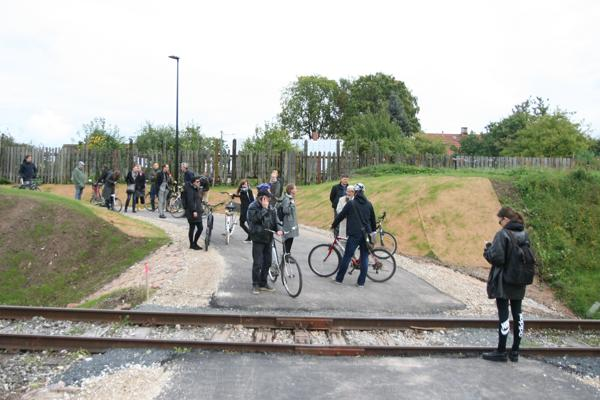

In [481]:
img198labels = train_y.iloc[[129]]
img198labels.columns[img198labels.iloc[0]==1]

Index(['l0', 'l4', 'l17'], dtype='object')

<class 'numpy.ndarray'>


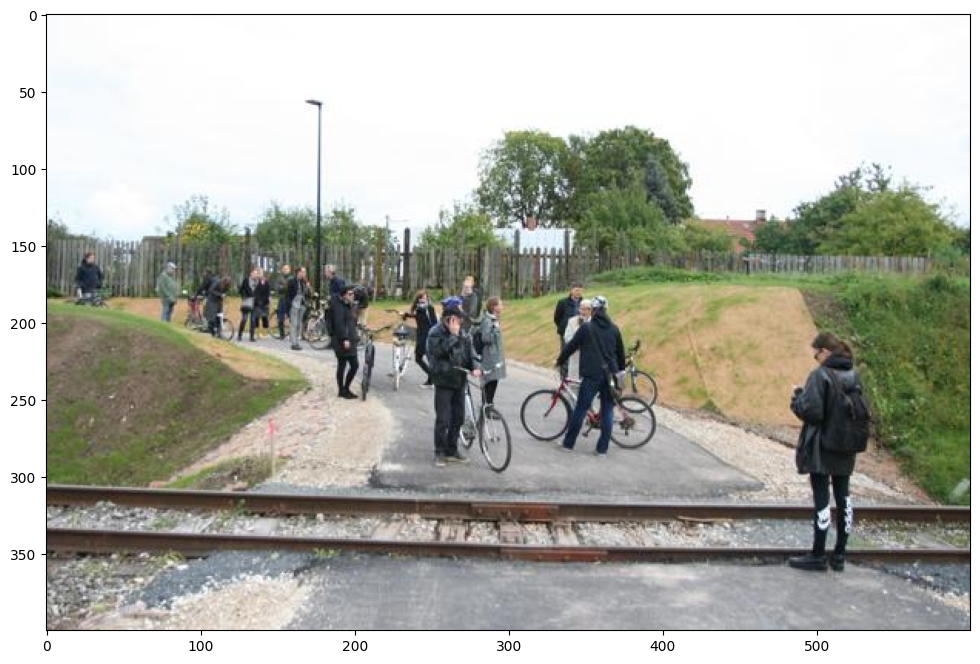

In [495]:
print(type(train_X.iloc[[178][0]]))
plt.imshow(train_X.iloc[[178][0]])
plt.show()

In [496]:
print(f"Loaded in {len(train_X), len(train_y)} train images and {len(test_X)} test images.")
print(f"Total: {len(train_X) + len(test_X)}")

Loaded in (182, 182) train images and 86 test images.
Total: 268


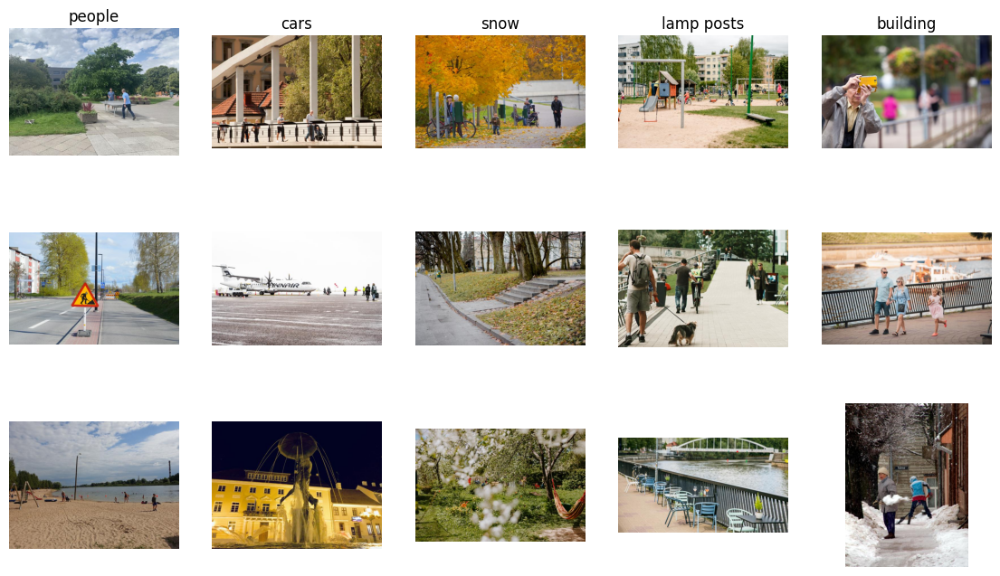

In [497]:
plt.rcParams['figure.figsize'] = (14.0, 8.0) # set default size of plots
# "Names" of classes:
class_names = ['l0','l9','l4','l15','l13']
readable_names = {"l0":"people", "l9":"cars", "l4":"snow", "l15":"lamp posts", "l13":"building"}
num_classes = len(class_names)

samples_per_class = 3 # Number of images from each class we want to see
for y, cls in enumerate(class_names):
    idxs = np.flatnonzero(train_y[cls])
    idxs = np.random.choice(idxs, samples_per_class, replace=False)
    for i, idx in enumerate(idxs):
        plt_idx = i * num_classes + y + 1
        plt.subplot(samples_per_class, num_classes, plt_idx)
        plt.imshow(train_X[idx], plt.get_cmap('gray'))
        plt.axis('off')
        if i == 0:
            plt.title(readable_names[cls])
plt.show()

### How to process images?

Images have different sizes

In [120]:
min_width = 5000
max_width = 0
min_height = 5000
max_height = 0
widths = []
heights = []
for i in range(len(train_X)):
  h, w, c = train_X.iloc[i].shape
  widths.append(w)
  heights.append(h)
  #print(h, w, c)
  if h > max_height:
    max_height = h
  elif h < min_height:
    min_height = h
  elif w > max_width:
    max_width = w
  elif w < min_width:
    min_width = w
print("min w-h", min_width, min_height)
print("max w-h", max_width, max_height)
print(f"Avg w {sum(widths) / len(widths)} and h {sum(heights) / len(heights)}.")

min w-h 400 284
max w-h 600 600
Avg w 572.415 and h 432.95.


In [128]:
a = np.array([[2,3],[4,4], [2,3]])
a.shape
train_X.iloc[0].shape

(600, 450, 3)

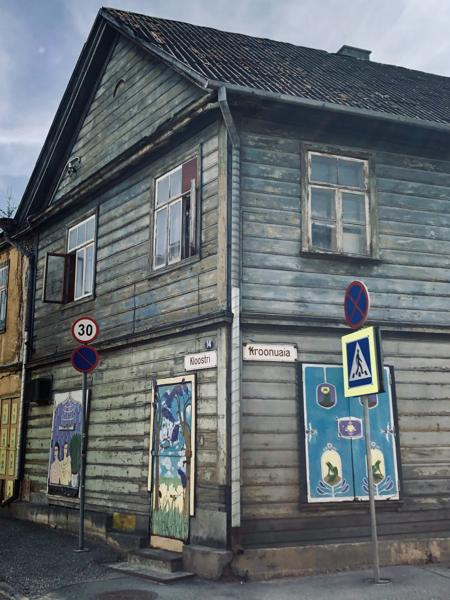

In [117]:
img = PIL.Image.fromarray(train_X[0])
img

225 300


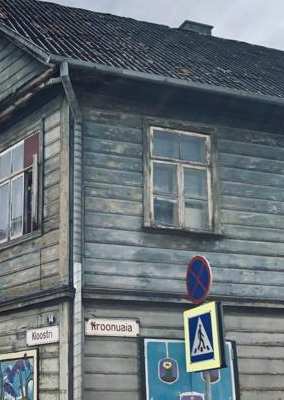

In [129]:
a = deepcopy(train_X[0])
h_centre = int(train_X[0].shape[0] / 2)
w_centre = int(train_X[0].shape[1] / 2)
print(w_centre, h_centre)
ab = a[w_centre-200:w_centre + 200, h_centre - 142:h_centre + 142]
im = PIL.Image.fromarray(ab)
im

Cropping all images to the smallest image size loses a lot of information.

Resizing to avg.

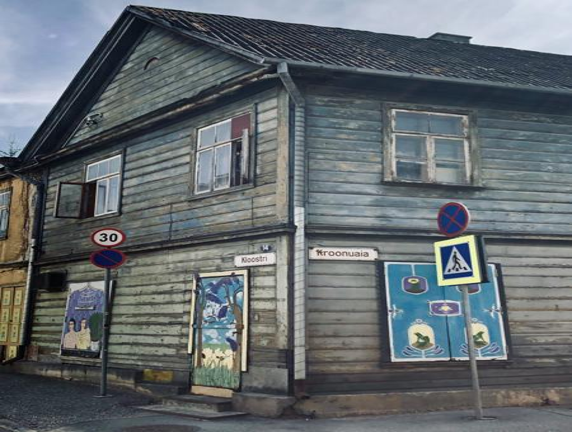

In [130]:
im = PIL.Image.fromarray(train_X[0])
img_resized = im.resize((572, 432))
img_resized

C:\Users\Taaniel\AppData\Local\Temp\ipykernel_18776\2999227815.py:2: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_resized = im.resize((572, 432), PIL.Image.LANCZOS)


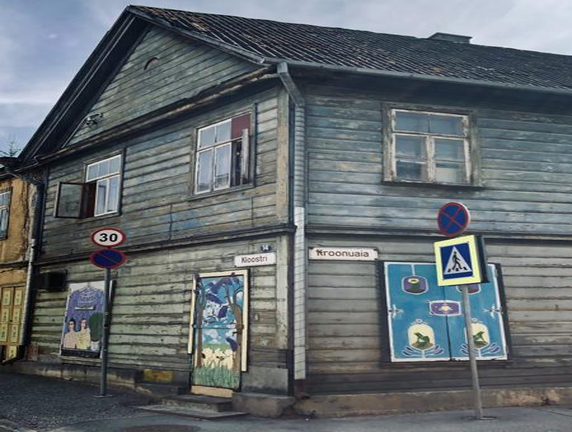

In [131]:
im = PIL.Image.fromarray(train_X[0])
img_resized = im.resize((572, 432), PIL.Image.LANCZOS)
img_resized

C:\Users\Taaniel\AppData\Local\Temp\ipykernel_18776\1662724911.py:2: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  img_resized = im.resize((572, 432), PIL.Image.BICUBIC)


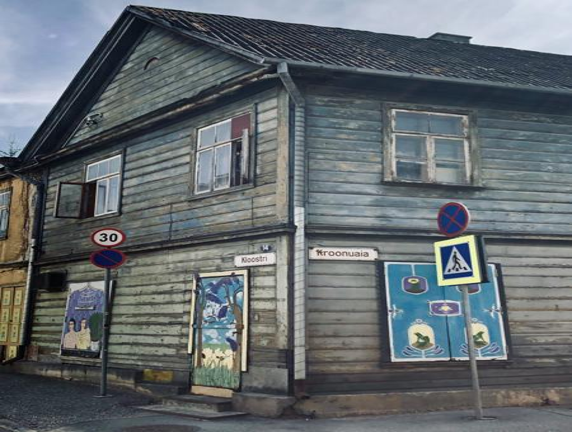

In [132]:
im = PIL.Image.fromarray(train_X[0])
img_resized = im.resize((572, 432), PIL.Image.BICUBIC)
img_resized

In [135]:
train_X_resized = []
for i in range(len(train_X)):
  im = PIL.Image.fromarray(train_X.iloc[i])
  img_resized = im.resize((572, 432), PIL.Image.BICUBIC)
  # to grayscale
  #img_grayscaled = img_resized.convert("L")
  train_X_resized.append(np.array(img_resized))

C:\Users\Taaniel\AppData\Local\Temp\ipykernel_18776\1645816978.py:4: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  img_resized = im.resize((572, 432), PIL.Image.BICUBIC)


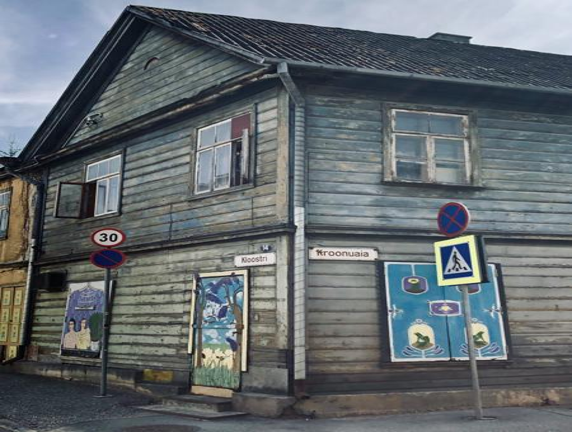

In [136]:
train_X_resized = np.array(train_X_resized)
im = PIL.Image.fromarray(train_X_resized[0])
im

In [137]:
train_X_normalized = train_X_resized / 255
train_X_normalized.shape

(200, 432, 572, 3)

In [138]:
#train_X_reshaped = train_X_normalized.reshape(-1, 432, 572, 1)
#train_X_reshaped[0].shape

### Models

In [153]:
train_y_np = train_y.to_numpy("float64")
train_y_np.dtype

dtype('float64')

In [160]:
X_train, X_test, y_train, y_test = train_test_split(train_X_normalized, train_y, random_state=42, test_size=0.2)

In [161]:
model = Sequential()
model.add(Conv2D(filters=16, kernel_size=(5, 5), activation="relu", input_shape=(432, 572, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(filters=32, kernel_size=(5, 5), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.25))
model.add(Conv2D(filters=64, kernel_size=(5, 5), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))
#model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(21, activation='sigmoid'))

In [162]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 428, 568, 16)      1216      
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 214, 284, 16)     0         
 g2D)                                                            
                                                                 
 dropout_12 (Dropout)        (None, 214, 284, 16)      0         
                                                                 
 conv2d_13 (Conv2D)          (None, 210, 280, 32)      12832     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 105, 140, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 101, 136, 64)     

In [163]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [164]:
model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), batch_size=16)

Epoch 1/10
10/10 [==============================] - 33s 3s/step - loss: 1.0207 - accuracy: 0.0688 - val_loss: 0.5375 - val_accuracy: 0.1000
Epoch 2/10
10/10 [==============================] - 28s 3s/step - loss: 0.4967 - accuracy: 0.0437 - val_loss: 0.4793 - val_accuracy: 0.3500
Epoch 3/10
10/10 [==============================] - 27s 3s/step - loss: 0.4423 - accuracy: 0.1937 - val_loss: 0.3835 - val_accuracy: 0.4250
Epoch 4/10
10/10 [==============================] - 28s 3s/step - loss: 0.4285 - accuracy: 0.1813 - val_loss: 0.3674 - val_accuracy: 0.4250
Epoch 5/10
10/10 [==============================] - 27s 3s/step - loss: 0.4143 - accuracy: 0.1937 - val_loss: 0.3855 - val_accuracy: 0.4250
Epoch 6/10
10/10 [==============================] - 27s 3s/step - loss: 0.3943 - accuracy: 0.2188 - val_loss: 0.3892 - val_accuracy: 0.4250
Epoch 7/10
10/10 [==============================] - 28s 3s/step - loss: 0.3850 - accuracy: 0.2750 - val_loss: 0.4045 - val_accuracy: 0.3750
Epoch 8/10
10/10 [==

In [165]:
# Loss and accuracy on test set
model.evaluate(X_test, y_test)

2/2 [==============================] - 1s 188ms/step - loss: 0.3683 - accuracy: 0.4250


[0.3682830333709717, 0.42500001192092896]

In [168]:
preds = model.predict(X_test)
#multilabel_confusion_matrix(y_test, y_pred)
preds

2/2 [==============================] - 1s 187ms/step


array([[0.44016692, 0.40097275, 0.2777613 , 0.29395917, 0.28712988,
        0.27192923, 0.25389662, 0.24127726, 0.2500013 , 0.23022553,
        0.1717401 , 0.17360325, 0.17740194, 0.13931595, 0.16407835,
        0.18592428, 0.15150261, 0.16924204, 0.17112239, 0.20735705,
        0.15115115],
       [0.4430578 , 0.3781085 , 0.25800654, 0.2853222 , 0.26030234,
        0.2567618 , 0.23197569, 0.23092504, 0.2394827 , 0.2090039 ,
        0.15374199, 0.15626106, 0.17076854, 0.12306625, 0.15948069,
        0.16371919, 0.13220711, 0.1605202 , 0.15609626, 0.20629203,
        0.1409324 ],
       [0.43147287, 0.38787806, 0.24746038, 0.27062702, 0.2583179 ,
        0.24636908, 0.21768776, 0.21222217, 0.22518964, 0.19972445,
        0.14550042, 0.14263329, 0.15087475, 0.11005479, 0.13770737,
        0.15543622, 0.12497848, 0.14790346, 0.1405352 , 0.17923866,
        0.12532124],
       [0.43017775, 0.37518564, 0.24106081, 0.26506403, 0.24409792,
        0.23878072, 0.21384694, 0.20737731, 0.2182279

In [169]:
# get top 3 preds
import heapq
cols = train_y.columns.tolist()
as_dataframe = pd.DataFrame(preds, columns = train_y.columns.tolist())
min_treshold = 0.10
row_results = []

for index, row in as_dataframe.iterrows():
    res = []
    col = 0
    values = row.to_numpy()
    top3 = np.argpartition(values, -3)[-3:]
    top3 = np.flip(top3[np.argsort(values[top3])])
    
    for top in top3:
        if values[top] >= min_treshold:
            res.append(cols[top])
    row_results.append(res)
    #print(res)
print(row_results)


[['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3'], ['l0', 'l1', 'l3']]


# FastAI

You should consider upgrading via the 'C:\Users\Taaniel\Documents\Courses\ML\project\ML_2022_project\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [498]:
from fastai.vision.all import *

In [499]:
batch_tfms = aug_transforms(flip_vert=True, max_lighting=0.1, max_zoom=1.05, max_warp=0.)

In [500]:
block = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                 get_x=ColReader(0, pref="./data/images/"),
                 splitter=RandomSplitter(),
                 get_y=ColReader(1, label_delim=" "),
                 batch_tfms = batch_tfms)

In [399]:
#train_fastai.at[143, "labels"] ="aaa"
train_fastai.iloc[143]
for label in train_fastai.labels:
    print(label)

l18
l0
l14 l3
l2
l0 l6
l3 l9
l0 l1 l2 l20 l6
l1 l20 l5 l6
l11 l3
l1 l10 l19 l6
l1 l5 l6
l2
l0 l2 l6
l0 l2 l6
l1 l10 l20 l5 l6

l0 l6
l0 l3 l7 l9
l18 l3

l1 l3
l0 l1 l2 l3 l7
l8
l0 l14 l5 l7 l9
l3 l4
l1 l5 l6


l8
l0 l1 l17 l4 l5 l7
l14 l2 l5 l9

l21
l0 l17 l4
l0 l13
l0 l1 l11
l1 l3 l7 l9
l1 l11 l12 l2 l8
l1 l15 l3 l7
l0 l10 l11 l7
l0 l13 l5
l8
l0 l3 l4
l0 l1 l5
l10 l2
l0 l14 l5 l7
l17 l3 l4 l7
l0 l5
l0 l12 l7
l3 l6
l0 l19 l20 l9
l0 l5
l0 l17 l4
l0 l10 l13
l1 l3 l4 l9
l13
l4

l0 l1 l5
l0 l4
l0 l1 l10 l5 l9
l10 l6
l0 l4
l3 l6
l0 l1 l20 l9
l3
l0 l1 l19 l21 l3
l21 l8
l1 l18 l2 l5 l7 l9
l1 l15 l18 l2 l21
l0 l2 l4
l3 l4
l0 l1 l4
l0 l1
l10 l20 l8
l4
l0
l1 l12 l14 l15 l5 l7
l0 l1 l12
l3 l8
l8
l2
l0 l2 l3
l0
l1 l17 l4
l1 l20 l5 l7
l0 l1 l10 l2 l6
l0 l1 l21 l3
l21

l1 l21
l1
l0
l0
l14 l19 l7
l1 l11 l17 l4 l5
l3 l6

l1 l18 l2 l3 l7
l1 l6
l1 l20 l6
l1 l4

l4 l8
l1 l5 l9
l0 l1

l1 l18 l2 l3
l3 l6
l0 l11 l12 l7
l12
l0 l6
l1 l13 l2 l5 l7
l0
l1 l11 l12 l8
l1 l20 l6 l9
l1 l15 l3 l7 l9
l0
l6
l1 l14 l15 

In [501]:
block = block.new(item_tfms=Resize(400, ResizeMethod.Pad, pad_mode="zeros"))

In [502]:
dls = block.dataloaders(train_less_labels)

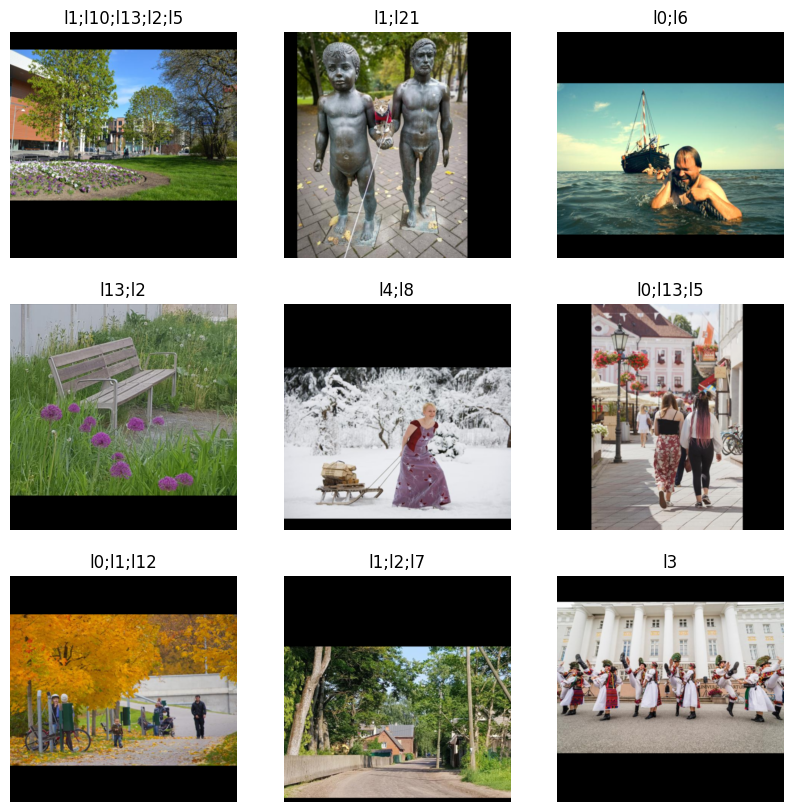

In [503]:
dls.show_batch(max_n=9, figsize=(10, 10))

In [504]:
from torchvision.models import resnet34

In [505]:
from fastai.metrics import accuracy_multi

In [506]:
learn = vision_learner(dls, resnet34, pretrained=True, metrics=[accuracy_multi])

C:\Users\Taaniel\Documents\Courses\ML\project\ML_2022_project\venv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Taaniel\Documents\Courses\ML\project\ML_2022_project\venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [507]:
class BCEWithLogitsLossFlat(BaseLoss):
    "Same as `nn.BCEWithLogitsLoss`, but flattens input and target."
    @use_kwargs_dict(keep=True, weight=None, reduction='mean', pos_weight=None)
    def __init__(self, *args, axis=-1, floatify=True, thresh=0.5, **kwargs):
        if kwargs.get('pos_weight', None) is not None and kwargs.get('flatten', None) is True:
            raise ValueError("`flatten` must be False when using `pos_weight` to avoid a RuntimeError due to shape mismatch")
        if kwargs.get('pos_weight', None) is not None: kwargs['flatten'] = False
        super().__init__(nn.BCEWithLogitsLoss, *args, axis=axis, floatify=floatify, is_2d=False, **kwargs)
        self.thresh = thresh

    def decodes(self, x):    return x>self.thresh
    def activation(self, x): return torch.sigmoid(x)

In [508]:
learn.loss_func = BCEWithLogitsLossFlat()

SuggestedLRs(valley=0.0012022644514217973)

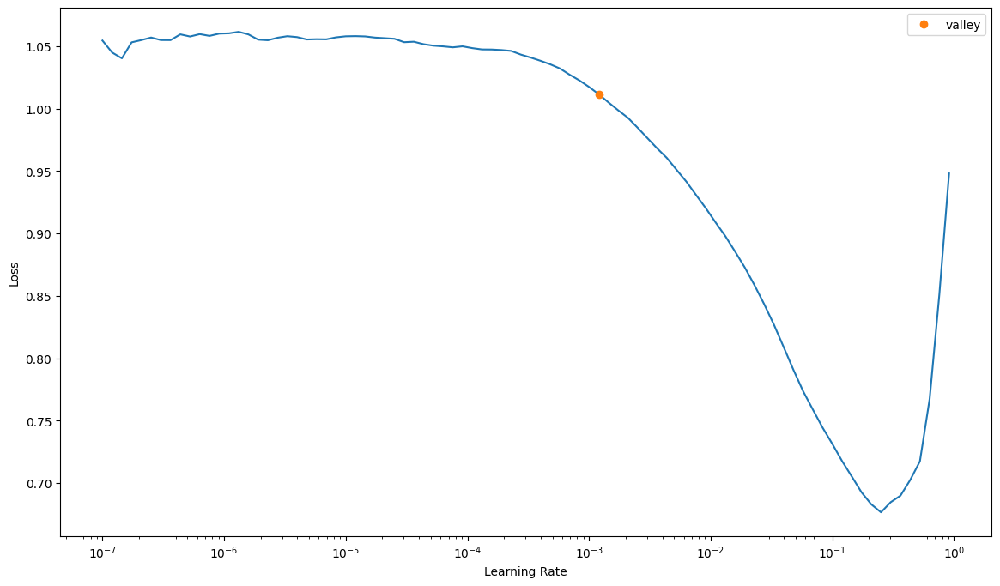

In [509]:
learn.lr_find()

In [510]:
lr = 1e-3
learn = learn.to_fp16()

In [511]:
learn.fit_one_cycle(5, slice(lr))

C:\Users\Taaniel\Documents\Courses\ML\project\ML_2022_project\venv\lib\site-packages\torch\amp\autocast_mode.py:202: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')
C:\Users\Taaniel\Documents\Courses\ML\project\ML_2022_project\venv\lib\site-packages\torch\cuda\amp\grad_scaler.py:118: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn("torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.")


epoch,train_loss,valid_loss,accuracy_multi,time
0,1.064120,1.665410,0.379630,00:42
1,1.048465,1.332526,0.396825,00:45
2,1.017727,1.152344,0.421958,00:45
3,0.982227,1.052137,0.444444,00:45
4,0.961923,0.983142,0.452381,00:44


In [512]:
learn.save('stage-1')

Path('models/stage-1.pth')

SuggestedLRs(valley=0.0004786300996784121)

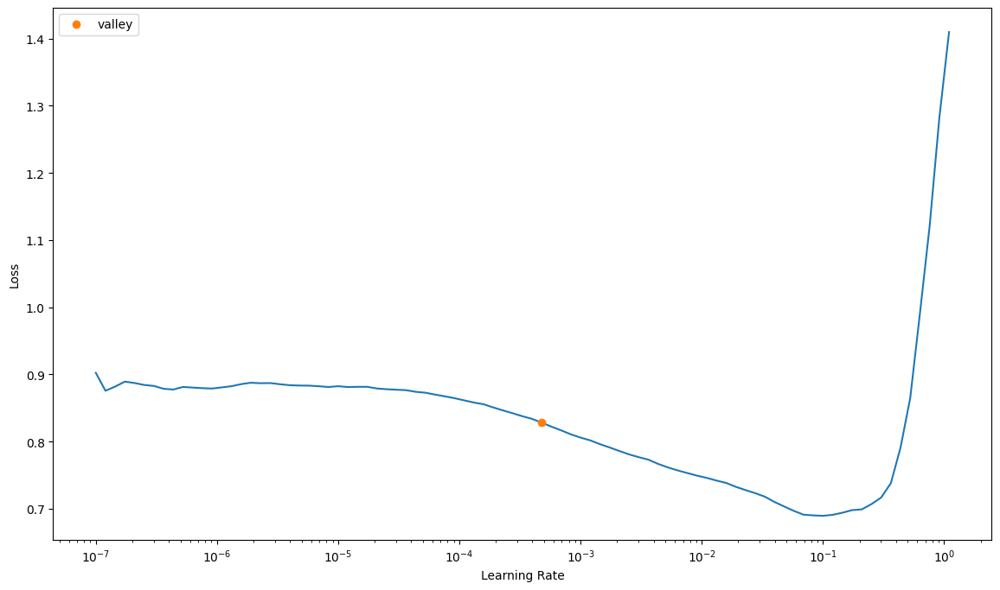

In [513]:
learn.unfreeze()
learn.lr_find()

In [514]:
learn.fit_one_cycle(5, slice(1e-3, lr/5))

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.881829,0.942195,0.460317,00:56
1,0.869073,0.941548,0.472222,00:59
2,0.860055,1.044294,0.416667,00:58
3,0.853719,1.048684,0.398148,00:58
4,0.844934,0.970004,0.435185,00:59


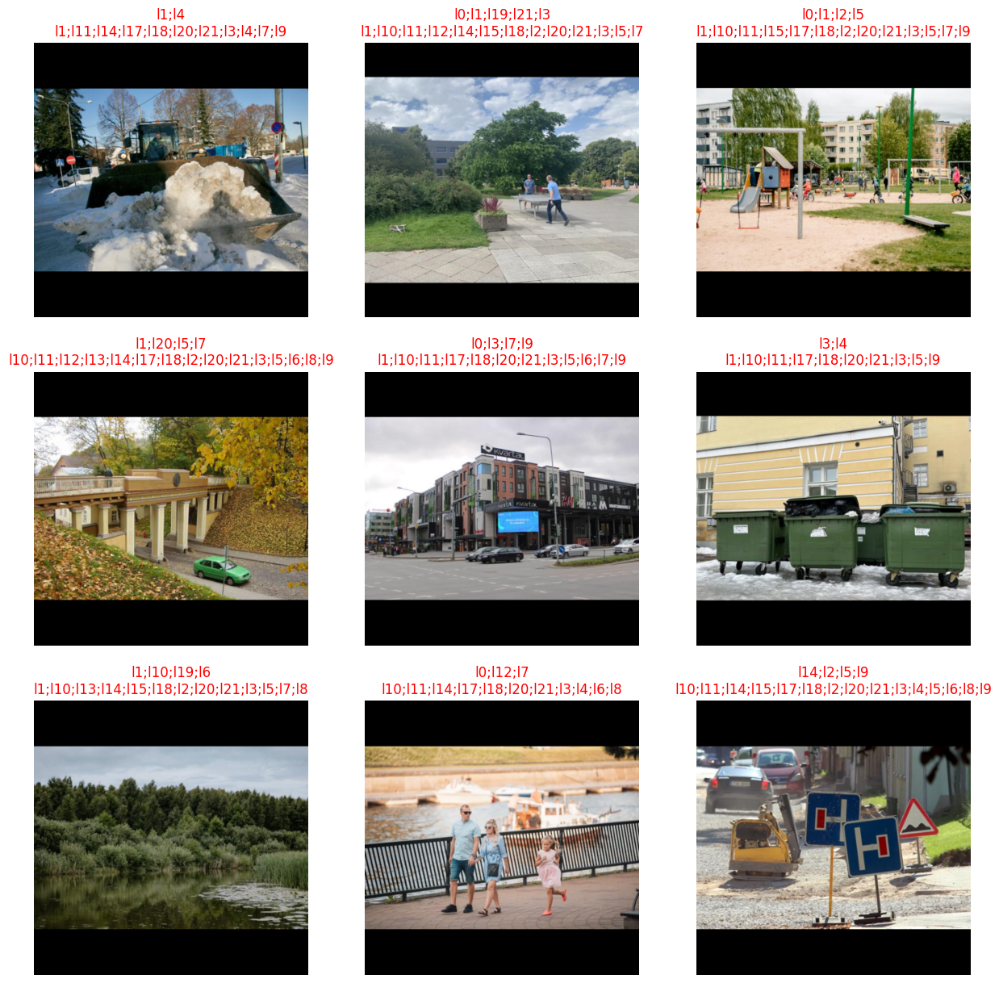

In [515]:
learn.show_results(figsize=(15,15))

In [ ]:
learn.save('stage-2')

img288 missing, img285 missing

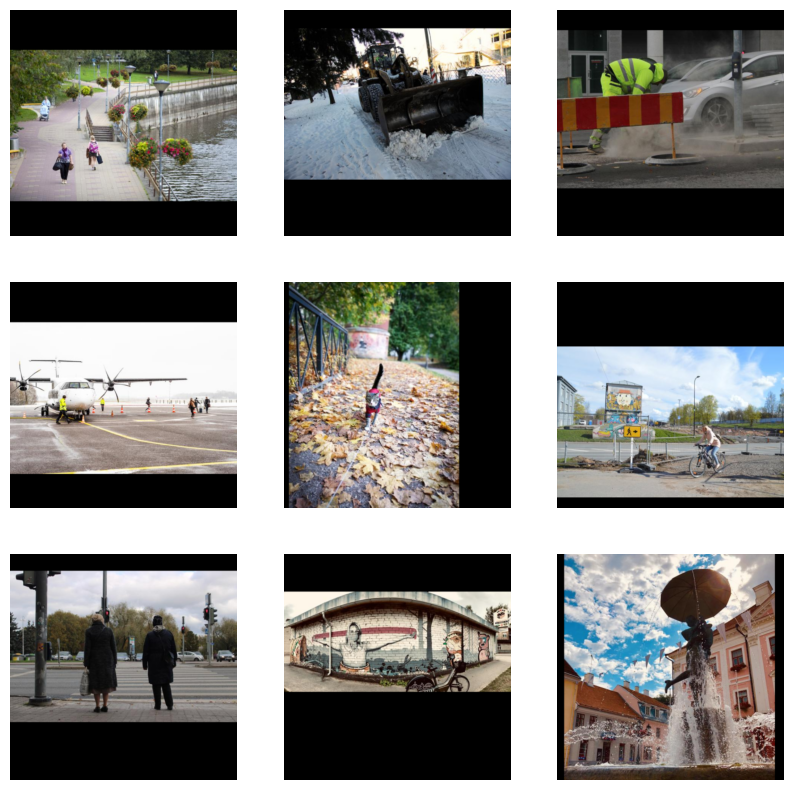

In [516]:
#batch_tfms = aug_transforms(size=300)
block = DataBlock(blocks=(ImageBlock),
                 get_x=ColReader(0, pref="./data/images/"))
block = block.new(item_tfms=Resize(400, ResizeMethod.Pad, pad_mode="zeros"))
dls = block.dataloaders(test_data)
dls.show_batch(max_n=9, figsize=(10, 10))


In [543]:
#dl = learn.dls.test_dl(test_data, bs=64)
#preds, _ = learn.get_preds(dl= dls)
print(learn.dls.vocab)
print(learn.dls.c)
min_probability = 0.79
filenames = []
predictions = []
for image_name in test_data["image_id"]:
    #print(image_name)
    pred = learn.predict("./data/images/"+image_name)
    #print(pred)
    pred_labels = pred[0]
    preds = pred[2]
    ind = np.argpartition(preds, -5)[-5:]
    #print(ind)
    ind = ind.tolist()
    best_preds_labels = learn.dls.vocab[ind]
    #print(best_preds_labels)
    probabilities = preds[ind]
    #print(probabilities)
    final_labels = []
    for i, proba in enumerate(probabilities):
        if proba > min_probability:
            final_labels.append(best_preds[i])
    #print(final_labels)
    final_labels.reverse()
    #print(final_labels)
    
    #print("CSVsse", image_name, " ".join(final_labels))
    filenames.append(image_name)
    predictions.append(" ".join(final_labels))
    #print(len(preds), len(pred_labels))

['l0', 'l1', 'l10', 'l11', 'l12', 'l13', 'l14', 'l15', 'l17', 'l18', 'l19', 'l2', 'l20', 'l21', 'l3', 'l4', 'l5', 'l6', 'l7', 'l8', 'l9']
21


In [544]:
print(filenames)
print(predictions)

['img102.jpg', 'img103.jpg', 'img11.jpg', 'img113.jpg', 'img114.jpg', 'img121.jpg', 'img126.jpg', 'img131.jpg', 'img136.jpg', 'img137.jpg', 'img139.jpg', 'img140.jpg', 'img15.jpg', 'img150.jpg', 'img151.jpg', 'img152.jpg', 'img156.jpg', 'img161.jpg', 'img166.jpg', 'img167.jpg', 'img170.jpg', 'img173.jpg', 'img176.jpg', 'img18.jpg', 'img180.jpg', 'img181.jpg', 'img182.jpg', 'img183.jpg', 'img189.jpg', 'img192.jpg', 'img194.jpg', 'img195.jpg', 'img206.jpg', 'img208.jpg', 'img209.jpg', 'img211.jpg', 'img212.jpg', 'img218.jpg', 'img22.jpg', 'img221.jpg', 'img228.jpg', 'img230.jpg', 'img231.jpg', 'img234.jpg', 'img238.jpg', 'img243.jpg', 'img247.jpg', 'img248.jpg', 'img249.jpg', 'img250.jpg', 'img251.jpg', 'img252.jpg', 'img257.jpg', 'img259.jpg', 'img262.jpg', 'img265.jpg', 'img266.jpg', 'img279.jpg', 'img280.jpg', 'img281.jpg', 'img292.jpg', 'img296.jpg', 'img3.jpg', 'img300.jpg', 'img33.jpg', 'img37.jpg', 'img39.jpg', 'img41.jpg', 'img42.jpg', 'img43.jpg', 'img48.jpg', 'img49.jpg', 'img5

In [545]:
d = {"image_id": filenames, "labels": predictions}
df = pd.DataFrame(d, columns=["image_id", "labels"])

In [546]:
df

,image_id,labels
0,img102.jpg,l3 l21 l18
1,img103.jpg,l3 l21 l18 l5 l12
2,img11.jpg,l21 l18 l5
3,img113.jpg,l3 l21 l5
4,img114.jpg,l3 l21 l18 l5 l12
...,...,...
81,img81.jpg,l3 l21 l18
82,img84.jpg,l3
83,img90.jpg,l3 l21 l18 l5 l12
84,img93.jpg,l3 l21 l18 l5 l12


In [548]:
df.to_csv("submission.csv", index=False)